# Dynamic Analysis using the Barabasi et al. theses
###### Nils Dyck, 12.06.2023

## CIAA-CIAA

In [1]:
import pandas as pd, networkx as nx, matplotlib.pyplot as plt, numpy as np, community

ciaa = pd.read_csv('../data/cleaned/CIAA-CIAA_m2.csv', sep=';')

ciaa_dynamic = [ciaa.loc[ciaa['Year']<=year] for year in range(1996,2023) if year != 2020]

ciaa_all = pd.read_csv('../data/cleaned/DATASET3.csv',sep=';')
ciaa_all = ciaa_all.drop_duplicates(subset='Title')
#print(set(ciaa_all['Year'].to_list()))
ciaa_all_dynamic = [ciaa_all.loc[ciaa_all['Year']<year] for year in range(1997,2023)]

plt.rcParams['font.family'] = 'serif'
plt.rc('font', size=15)

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


False
Year:2017
Number of nodes:782
Size of the largest component:91
New nodes at the largest component: 91
New nodes not at the largest component: 691
True
Year:2018
Number of nodes:805
Size of the largest component:108
New nodes at the largest component: 4
New nodes not at the largest component: 19
True
Year:2019
Number of nodes:824
Size of the largest component:183
New nodes at the largest component: 8
New nodes not at the largest component: 11


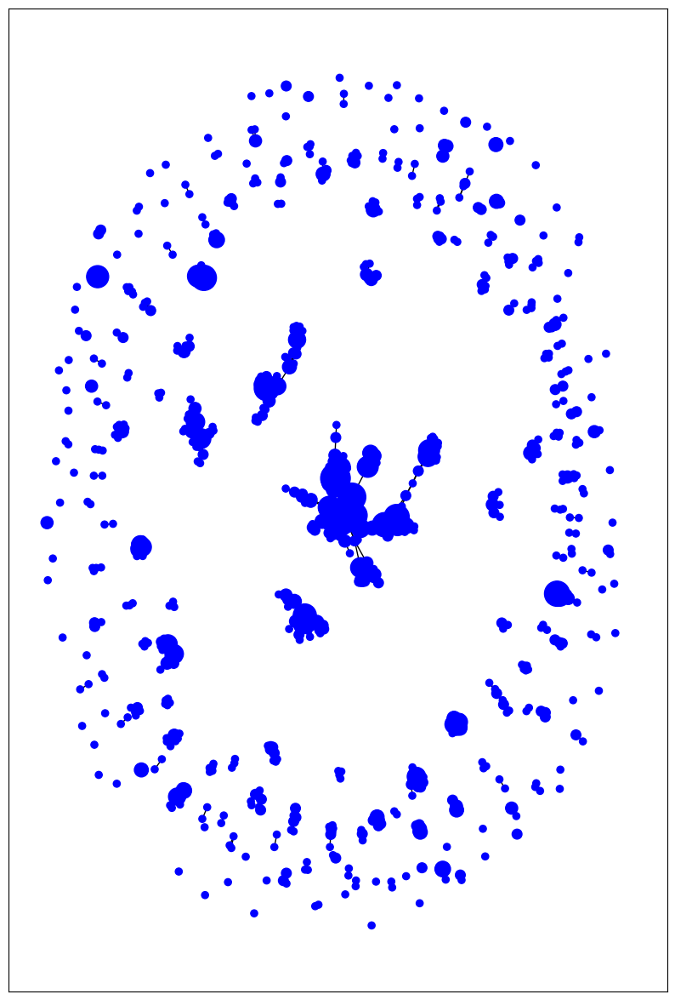

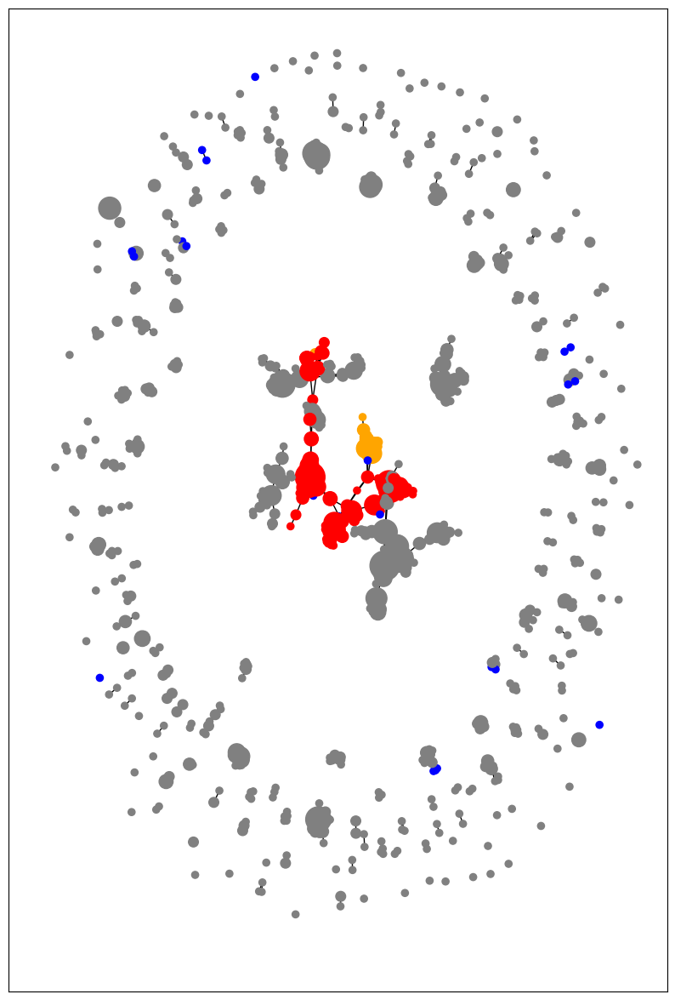

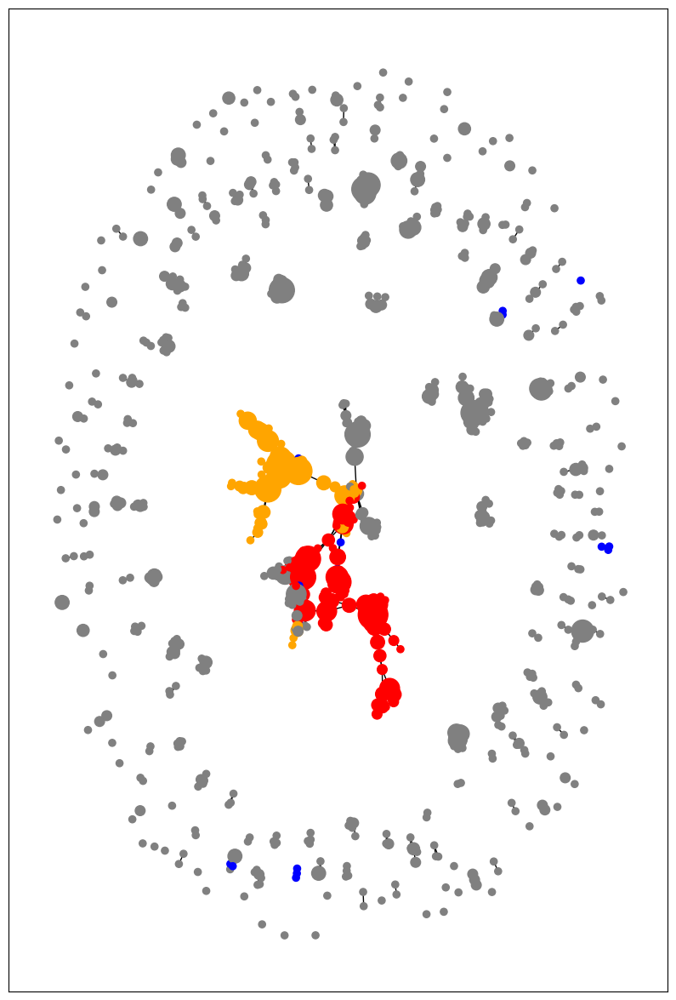

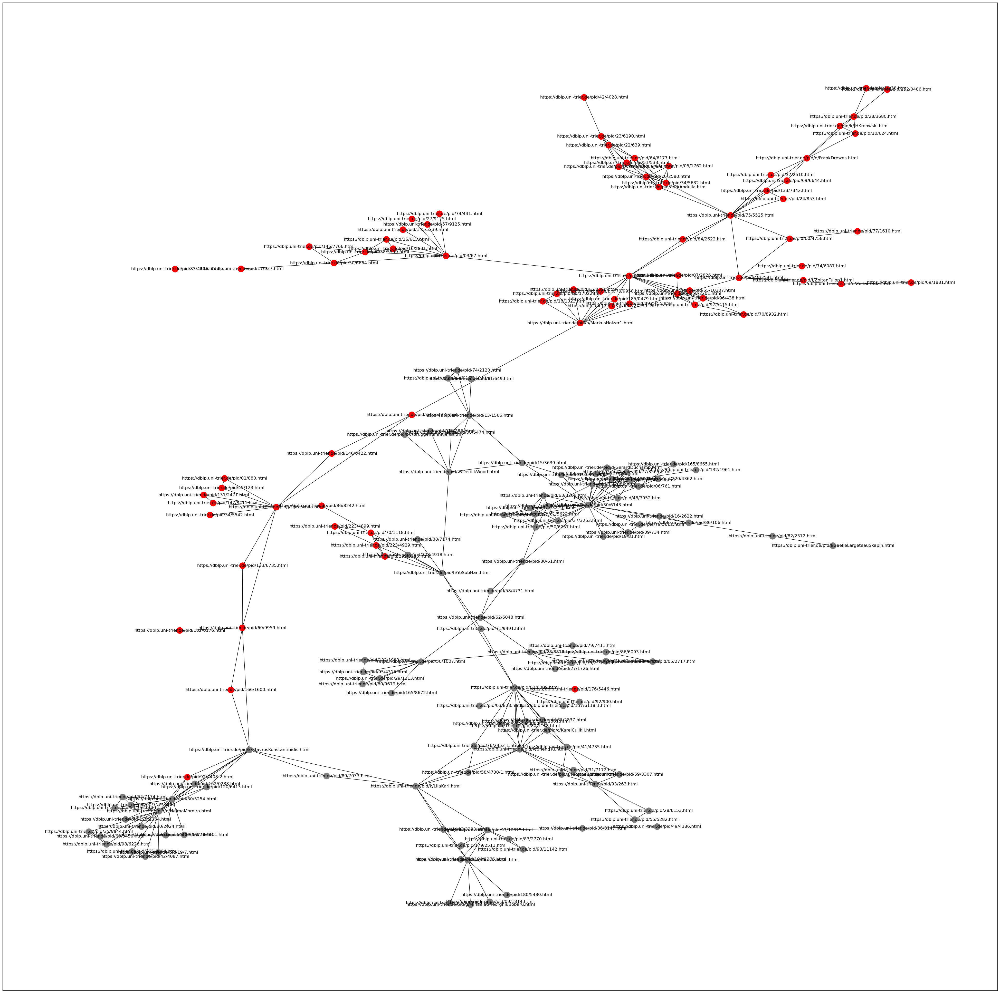

In [2]:
average_separation = []
clustering_coefficient = []
no_authors = []
largest_components = []
ciaa_no_components = []
ciaa_largest_component_avg_separation = []
last_nodes = []
last_largest_component = []
picture = [2017,2018,2019]
year = 1996
ciaa_average_degree = []
for conference in ciaa_dynamic:
    authors = conference['Author'].to_list()
    co_authors = conference['Co-Authors'].to_list()    
    G = nx.Graph()
    G.add_nodes_from(set(authors))

    for i in range(len(authors)):    
        entries = co_authors[i].replace('[','').replace(']','').replace('"','').replace("'",'') 
        if entries != '':
            entries = entries.split(', ')
            for entry in entries:
                G.add_edge(authors[i],entry)
                #edges.append([authors[i],entry])
                #l.append(entry)

    # Draw the new graph
    #plt.figure(figsize=(30,15))
    #nx.draw_kamada_kawai(G, with_labels=False, node_size=100, linewidths=0.0001)
    #plt.show()
    #print(G.number_of_nodes())
    no_authors.append(G.number_of_nodes())
    # Calculate the degree of each node
    degrees = [G.degree(node) for node in G.nodes()]

    # Plot the degree distribution on a log-log scale
    degree_counts = np.bincount(degrees)
    degrees_nonzero = np.nonzero(degree_counts)[0]
    # plt.scatter(degrees_nonzero, degree_counts[degrees_nonzero], alpha=0.7)
    # plt.xscale('log')
    # plt.yscale('log')
    # plt.xlabel('k')
    # plt.ylabel('P(k)')
    # plt.title('Degree Distribution (Log scale)')
    # plt.show()

    # Compute the average separation for each component
    ciaa_no_components.append(len(list(nx.connected_components(G))))
    component_avg_separations = []
    for component in nx.connected_components(G):
        subgraph = G.subgraph(component)
        avg_separation = nx.average_shortest_path_length(subgraph)
        if avg_separation != 0:
            component_avg_separations.append(avg_separation)

    # Compute the overall average separation
    overall_avg_separation = sum(component_avg_separations) / len(component_avg_separations)

    #print("Overall average separation:", overall_avg_separation)
    average_separation.append(overall_avg_separation)
    clustering_coefficient.append(nx.average_clustering(G))

    # Find the connected components
    components = nx.connected_components(G)
    # Find the largest component and its size
    largest_component = max(components, key=len)
    subgraph = G.subgraph(largest_component)
    ciaa_largest_component_avg_separation.append(nx.average_shortest_path_length(subgraph))
    largest_component_size = len(largest_component)
    largest_components.append(largest_component_size)

    #Compute average degree
    degree_sequence = [d for n, d in G.degree()]
    average_degree = sum(degree_sequence) / len(degree_sequence)
    ciaa_average_degree.append(average_degree)


    if year in picture:
        if year == 2017: inital_component = [largest_component]
        plt.figure(figsize=(10,15))
        # Find the communities
        #partition = community.best_partition(G)

        # # Create a color map
        # cmap = plt.get_cmap('hsv')
        # colors = [cmap(partition[node] / max(partition.values())) for node in G.nodes()]
        nodes = list(G.nodes())
        weight = {node: authors.count(node) for node in nodes}
        nx.set_node_attributes(G, weight, 'weight')
        node_sizes = [35 * G.nodes[node]['weight'] for node in G.nodes()]

        # Sort the components by size
        #components_sorted = sorted(components, key=len, reverse=True)

        # # Create a color map for the largest components
        # colors = ['red', 'blue', 'green', 'yellow', 'orange']
        # color_map = {}
        # for idx, component in enumerate(largest_components_5):
        #     for node in component:
        #         color_map[node] = colors[idx % len(colors)]

        # nx.draw_kamada_kawai(G, node_color=[color_map if node in color_map.keys() else 'gray' for node in G.nodes()], node_size=node_sizes, linewidths=0.00001)
        # #nx.draw_kamada_kawai(G, node_color=colors, linewidths=1)
        # plt.show()
        # plt.savefig('../../Figures/DCFS_'+str(year)+'.png')

        # Create a color map for the nodes
        #if year > 2006: G = subgraph
        blue1 = 0
        blue2 = 0
        if year == 1997 or year == 2022: color_map = ['red' if node in largest_component else 'gray' for node in G.nodes()]
        else: 
            color_map = []
            for node in G.nodes():
                if node in largest_component:
                    if node in last_largest_component: color_map.append('red')
                    elif node not in last_nodes: 
                        color_map.append('blue')
                        blue1 += 1
                    else: color_map.append('orange')
                elif node not in last_nodes: 
                    color_map.append('blue')
                    blue2 += 1
                else: color_map.append('gray')

        # Draw the graph
        pos = nx.spring_layout(G)  # Position the nodes using a spring layout
        nx.draw_networkx(G, pos, node_color=color_map, node_size=node_sizes, with_labels=False)        
        plt.savefig('../../Figures/CIAA_'+str(year)+'.png')
        if inital_component[0] in list(largest_component): print('True')
        else: 
            inital_component = list(largest_component)
            print('False')
        print('Year:'+str(year))
        print('Number of nodes:'+str(len(nodes)))
        print('Size of the largest component:'+str(largest_component_size))
        print('New nodes at the largest component: '+str(blue1))
        print('New nodes not at the largest component: '+str(blue2))
        if year == 2019:
            g = G.subgraph(largest_component)
            plt.figure(figsize=(50,50))
            pos = nx.spring_layout(g)  # Position the nodes using a spring layout
            color_map = ['red' if node not in last_largest_component else 'gray' for node in g.nodes()]
            nx.draw_networkx(g, pos, node_color=color_map, with_labels=True)  
            plt.show()
        if year == 1998:
            last_edges = G.edges()
        if year == 1999:
            print('new edges:')
            for edge in G.edges()-last_edges:
                for node in edge:
                    if node in largest_component:
                        print(edge)
            print('largest component:')
            print(largest_component)
        last_nodes = nodes
        last_largest_component = largest_component
    if year == 2019: year +=2
    else: year += 1

In [3]:
new_authors = set(largest_component)|(last_largest_component)

authors_2019 = ciaa.loc[ciaa['Year']==2019]['Author'].to_list()
print([author for author in new_authors if author in authors_2019])

['https://dblp.uni-trier.de/pid/h/YoSubHan.html', 'https://dblp.uni-trier.de/pid/60/9959.html', 'https://dblp.uni-trier.de/pid/k/MartinKutrib.html', 'https://dblp.uni-trier.de/pid/182/6122.html', 'https://dblp.uni-trier.de/pid/02/6009.html', 'https://dblp.uni-trier.de/pid/223/4929.html', 'https://dblp.uni-trier.de/pid/139/8245.html', 'https://dblp.uni-trier.de/pid/69/6644.html', 'https://dblp.uni-trier.de/pid/38/5599.html', 'https://dblp.uni-trier.de/pid/146/7766.html', 'https://dblp.uni-trier.de/pid/185/0479.html', 'https://dblp.uni-trier.de/pid/30/5254.html', 'https://dblp.uni-trier.de/pid/n/NelmaMoreira.html', 'https://dblp.uni-trier.de/pid/55/10307.html', 'https://dblp.uni-trier.de/pid/d/FrankDrewes.html', 'https://dblp.uni-trier.de/pid/k/StavrosKonstantinidis.html', 'https://dblp.uni-trier.de/pid/92/4408-2.html', 'https://dblp.uni-trier.de/pid/75/5525.html', 'https://dblp.uni-trier.de/pid/58/2201.html', 'https://dblp.uni-trier.de/pid/70/1118.html', 'https://dblp.uni-trier.de/pid/1

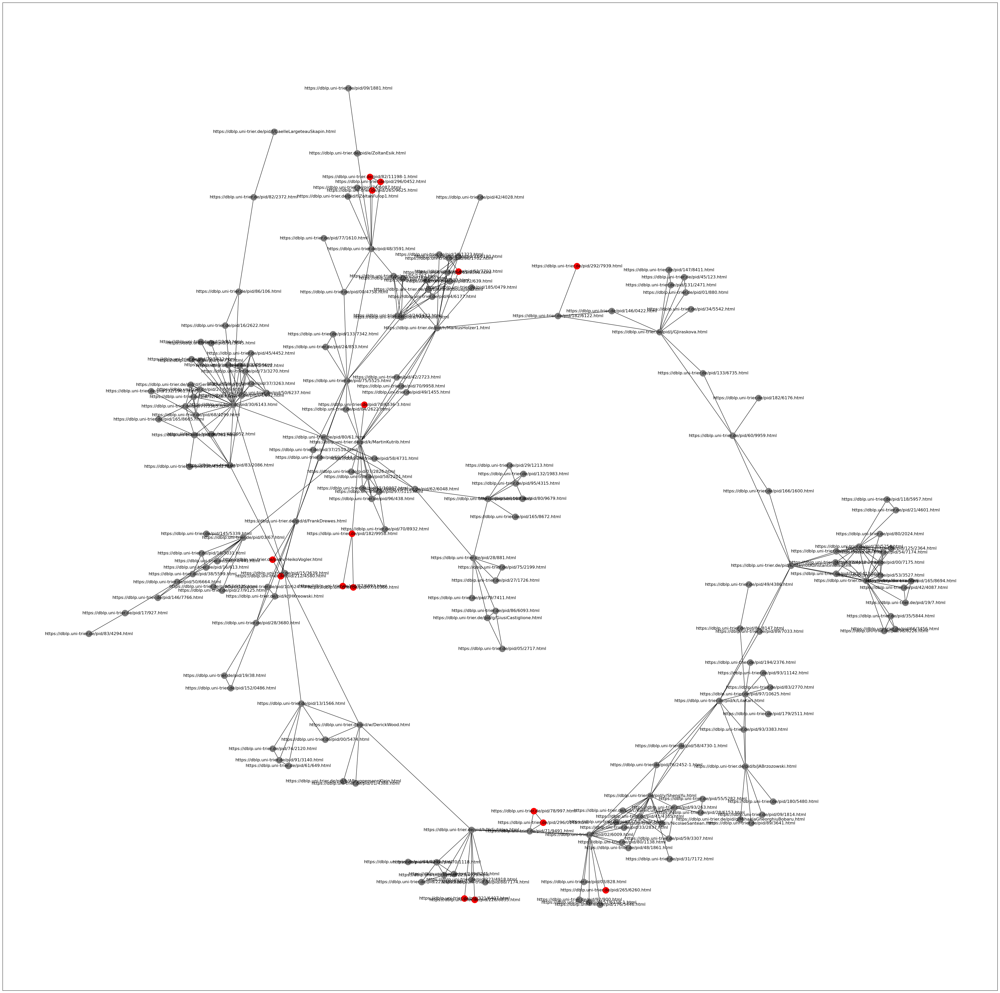

In [4]:
g = G.subgraph(largest_component)
plt.figure(figsize=(50,50))
pos = nx.spring_layout(g)  # Position the nodes using a spring layout
color_map = ['red' if node not in last_largest_component else 'gray' for node in g.nodes()]
nx.draw_networkx(g, pos, node_color=color_map, with_labels=True)  

In [5]:
g = G.subgraph(last_largest_component)
plt.figure(figsize=(100,100))
pos = nx.spring_layout(g)  # Position the nodes using a spring layout
nx.draw_networkx(g, pos, with_labels=True)  

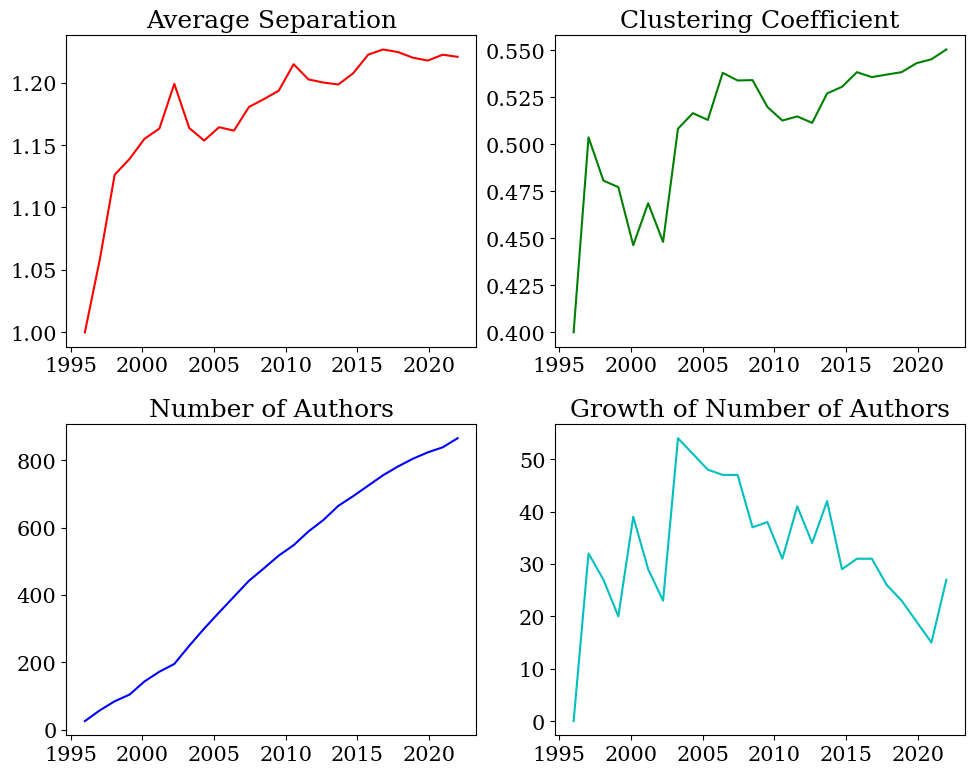

In [6]:
fig, axs = plt.subplots(2, 2, figsize=(10,8))  # Create a 2x2 grid of subplots
x = np.linspace(1996,2022,26)

growth = [no_authors[i+1]-no_authors[i] for i in range(len(no_authors)-1)]
growth = [0]+growth

ciaa_average_seaparation = average_separation
ciaa_cc = clustering_coefficient
ciaa_growth = growth
ciaa_no_authors = no_authors

# Plot on the first subplot (top-left)
axs[0, 0].plot(x,average_separation,'-r')
axs[0, 0].set_title('Average Separation')

# Plot on the second subplot (top-right)
axs[0, 1].plot(x,clustering_coefficient,'-g')
axs[0, 1].set_title('Clustering Coefficient')

# Plot on the third subplot (bottom-left)
axs[1, 0].plot(x,no_authors,'-b')
axs[1, 0].set_title('Number of Authors')

# Plot on the fourth subplot (bottom-right)
axs[1, 1].plot(x,growth,'-c')
axs[1, 1].set_title('Growth of Number of Authors')

# Adjust spacing between subplots
plt.tight_layout()

# Display the figure
plt.show()

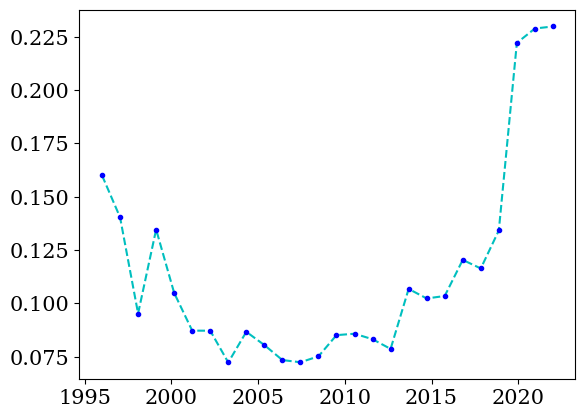

In [7]:
ciaa_relative_size = [largest_components[i]/no_authors[i] for i in range(len(largest_components))]
plt.plot(x,ciaa_relative_size,'--c')
plt.plot(x,ciaa_relative_size,'.b')
plt.show()

## CIAA-ALL

In [8]:

# average_separation = []
# clustering_coefficient = []
# no_authors = []
# test = [ciaa_all_dynamic[10]]
# for conference in ciaa_all_dynamic:
#     authors = conference['Author-URL'].to_list()
#     co_authors = conference['Co-Author-URLs'].to_list()    
#     G = nx.Graph()
#     G.add_nodes_from(set(authors))

#     for i in range(len(authors)):    
#         entries = co_authors[i].replace('[','').replace(']','').replace('"','').replace("'",'') 
#         if entries != '':
#             entries = entries.split(', ')
#             for entry in entries:
#                 G.add_edge(authors[i],entry)
#                 #edges.append([authors[i],entry])
#                 #l.append(entry)

#     # Draw the new graph
#     #plt.figure(figsize=(30,15))
#     #nx.draw_kamada_kawai(G, with_labels=False, node_size=100, linewidths=0.0001)
#     #plt.show()
#     #print(G.number_of_nodes())
#     no_authors.append(G.number_of_nodes())
#     # Calculate the degree of each node
#     degrees = [G.degree(node) for node in G.nodes()]

#     # Plot the degree distribution on a log-log scale
#     degree_counts = np.bincount(degrees)
#     degrees_nonzero = np.nonzero(degree_counts)[0]
#     # plt.scatter(degrees_nonzero, degree_counts[degrees_nonzero], alpha=0.7)
#     # plt.xscale('log')
#     # plt.yscale('log')
#     # plt.xlabel('k')
#     # plt.ylabel('P(k)')
#     # plt.title('Degree Distribution (Log scale)')
#     # plt.show()

#     # Compute the average separation for each component
#     component_avg_separations = []
#     for component in nx.connected_components(G):
#         subgraph = G.subgraph(component)
#         avg_separation = nx.average_shortest_path_length(subgraph)
#         component_avg_separations.append(avg_separation)

#     # Compute the overall average separation
#     overall_avg_separation = sum(component_avg_separations) / len(component_avg_separations)

#     #print("Overall average separation:", overall_avg_separation)
#     average_separation.append(overall_avg_separation)
#     clustering_coefficient.append(nx.average_clustering(G))

In [9]:
# growth = [no_authors[i+1]-no_authors[i] for i in range(len(no_authors)-1)]
# growth = [0]+growth

# fig, axs = plt.subplots(2, 2, figsize=(10,8))  # Create a 2x2 grid of subplots
# x = np.linspace(1996,2022,3)

# # Plot on the first subplot (top-left)
# axs[0, 0].plot(x,average_separation,'-r')
# axs[0, 0].set_title('Average Separation')

# # Plot on the second subplot (top-right)
# axs[0, 1].plot(x,clustering_coefficient,'-g')
# axs[0, 1].set_title('Clustering Coefficient')

# # Plot on the third subplot (bottom-left)
# axs[1, 0].plot(x,no_authors,'-b')
# axs[1, 0].set_title('Number of Authors')

# # Plot on the fourth subplot (bottom-right)
# axs[1, 1].plot(x,growth,'-c')
# axs[1, 1].set_title('Growth of Number of Authors')

# # Adjust spacing between subplots
# plt.tight_layout()

# # Display the figure
# plt.show()

## DCFS-DCFS

In [10]:
dcfs = pd.read_csv('../data/cleaned/DCFS-DCFS_m2.csv',sep=';')
dcfs_dynamic = [dcfs.loc[dcfs['Year']<=year] for year in range(2001,2023)]

False
101
7
New nodes at the largest component: 0
New nodes not at the largest component: 0
True
147
49
New nodes at the largest component: 17
New nodes not at the largest component: 29
True
182
81
New nodes at the largest component: 14
New nodes not at the largest component: 21
True
226
120
New nodes at the largest component: 20
New nodes not at the largest component: 24
True
434
213
New nodes at the largest component: 0
New nodes not at the largest component: 0


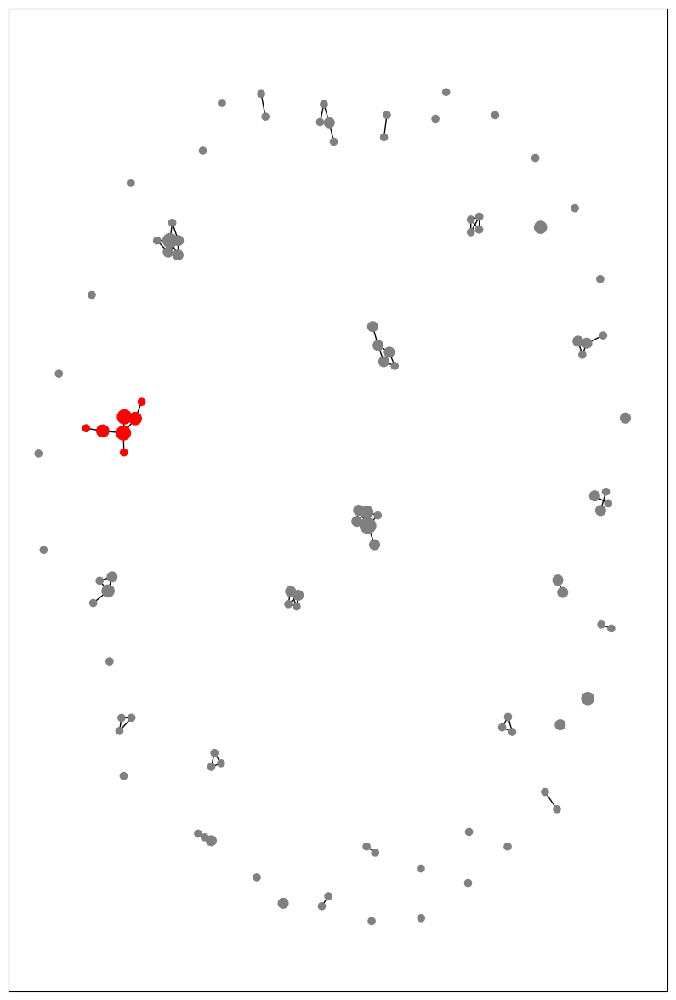

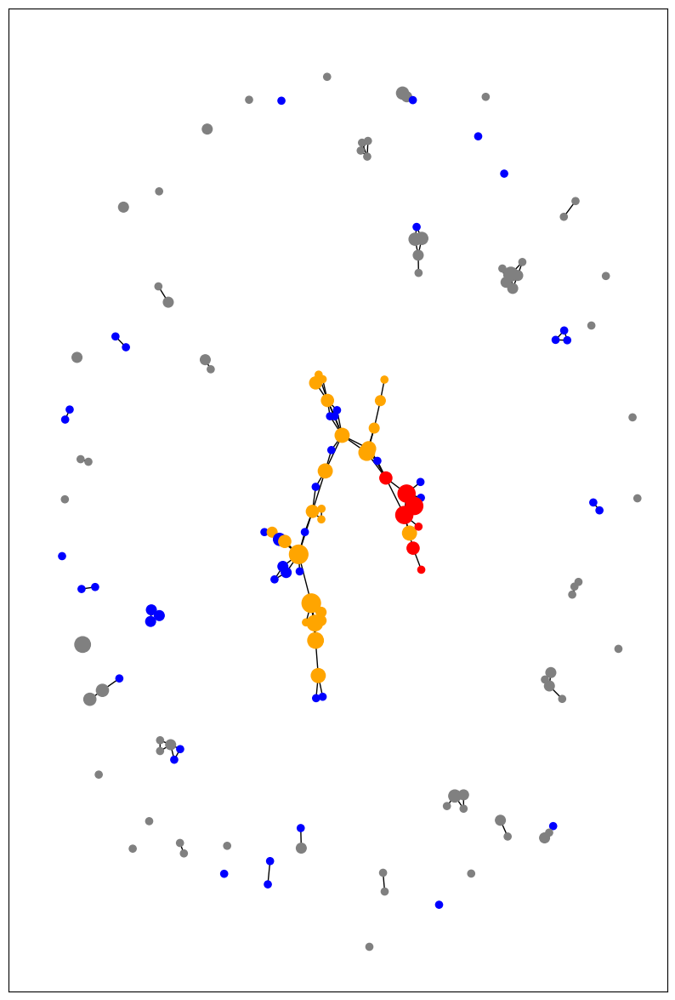

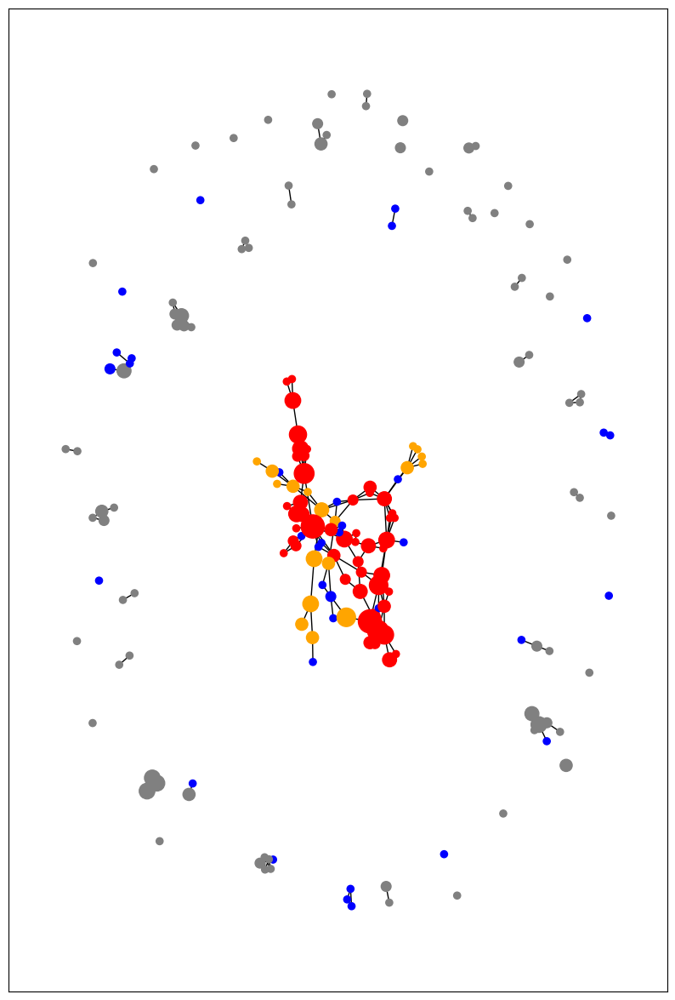

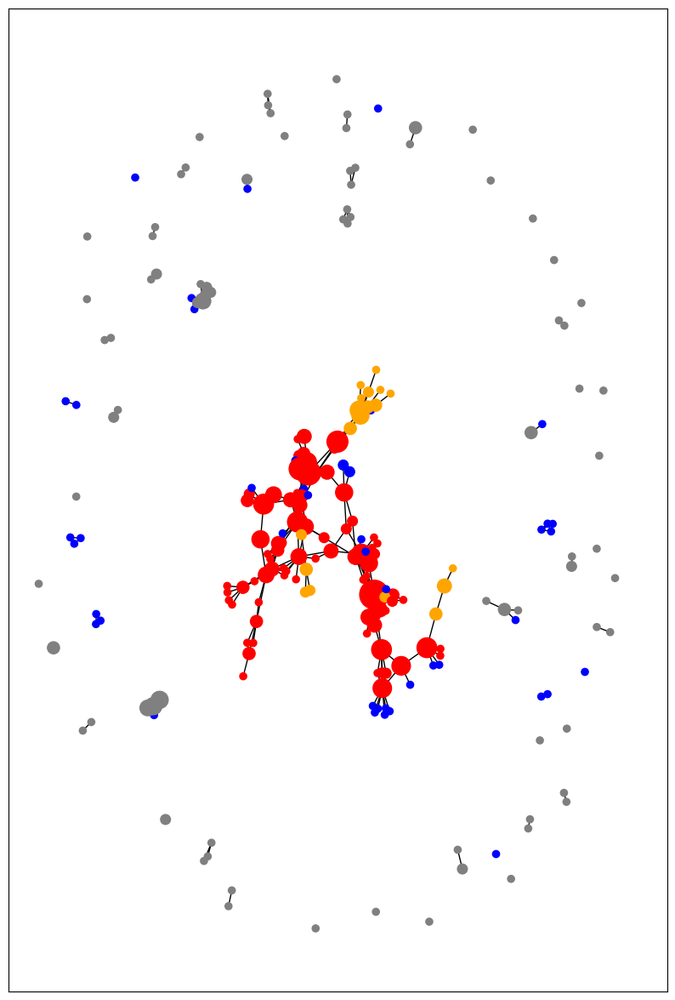

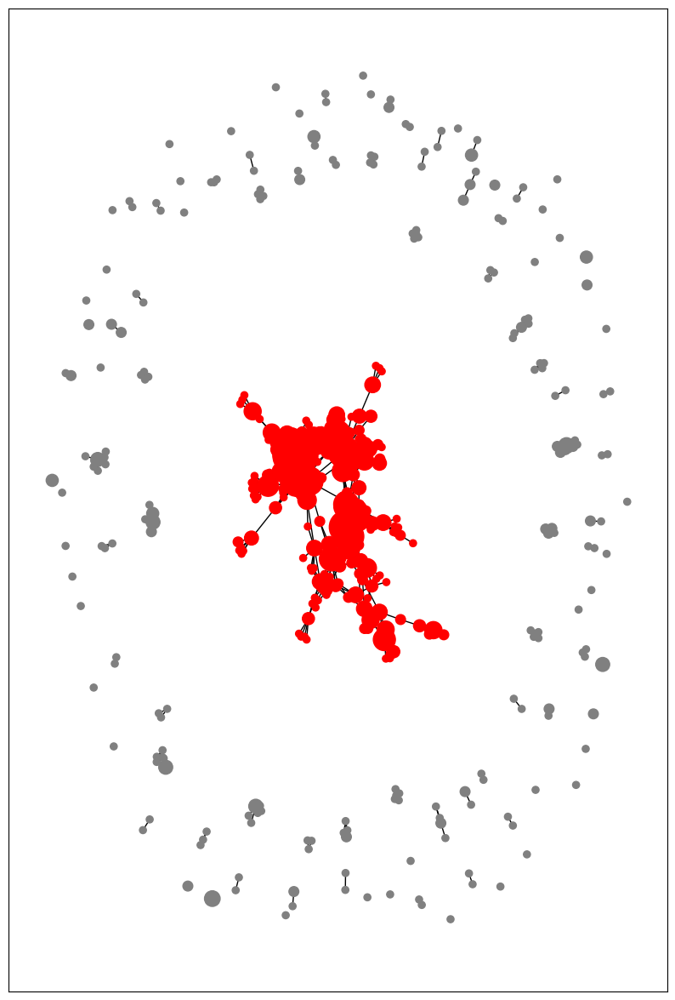

In [11]:
average_separation = []
clustering_coefficient = []
no_authors = []
largest_components = []
dcfs_no_components = []
dcfs_largest_component_avg_separation = []
dcfs_average_degree = []
last_nodes = []
last_largest_component = []
picture = [2004,2006,2009,2011,2022]
year = 2001
for conference in dcfs_dynamic:
    authors = conference['Author'].to_list()
    co_authors = conference['Co-Authors'].to_list()    
    G = nx.Graph()
    G.add_nodes_from(set(authors))

    for i in range(len(authors)):    
        entries = co_authors[i].replace('[','').replace(']','').replace('"','').replace("'",'') 
        if entries != '':
            entries = entries.split(', ')
            for entry in entries:
                G.add_edge(authors[i],entry)
                #edges.append([authors[i],entry])
                #l.append(entry)

    # Draw the new graph
    #plt.figure(figsize=(30,15))
    #nx.draw_kamada_kawai(G, with_labels=False, node_size=100, linewidths=0.0001)
    #plt.show()
    #print(G.number_of_nodes())
    no_authors.append(G.number_of_nodes())
    # Calculate the degree of each node
    degrees = [G.degree(node) for node in G.nodes()]

    # Plot the degree distribution on a log-log scale
    degree_counts = np.bincount(degrees)
    degrees_nonzero = np.nonzero(degree_counts)[0]
    # plt.scatter(degrees_nonzero, degree_counts[degrees_nonzero], alpha=0.7)
    # plt.xscale('log')
    # plt.yscale('log')
    # plt.xlabel('k')
    # plt.ylabel('P(k)')
    # plt.title('Degree Distribution (Log scale)')
    # plt.show()

    # Compute the average separation for each component
    dcfs_no_components.append(len(list(nx.connected_components(G))))
    component_avg_separations = []
    for component in nx.connected_components(G):
        subgraph = G.subgraph(component)
        avg_separation = nx.average_shortest_path_length(subgraph)
        if avg_separation != 0:
            component_avg_separations.append(avg_separation)
    # Compute the overall average separation
    overall_avg_separation = sum(component_avg_separations) / len(component_avg_separations)

    #Compute average degree
    degree_sequence = [d for n, d in G.degree()]
    average_degree = sum(degree_sequence) / len(degree_sequence)
    dcfs_average_degree.append(average_degree)

    #print("Overall average separation:", overall_avg_separation)
    average_separation.append(overall_avg_separation)
    clustering_coefficient.append(nx.average_clustering(G))
    # Find the connected components
    components = nx.connected_components(G)
    # Find the largest component and its size
    largest_component = max(components, key=len)
    subgraph = G.subgraph(largest_component)
    dcfs_largest_component_avg_separation.append(nx.average_shortest_path_length(subgraph))
    largest_component_size = len(largest_component)
    largest_components.append(largest_component_size)

    if year in picture:
        if year == 2004: inital_component = [largest_component]
        plt.figure(figsize=(10,15))
        # Find the communities
        #partition = community.best_partition(G)

        # # Create a color map
        # cmap = plt.get_cmap('hsv')
        # colors = [cmap(partition[node] / max(partition.values())) for node in G.nodes()]
        nodes = list(G.nodes())
        weight = {node: authors.count(node) for node in nodes}
        nx.set_node_attributes(G, weight, 'weight')
        node_sizes = [35 * G.nodes[node]['weight'] for node in G.nodes()]

        # Sort the components by size
        #components_sorted = sorted(components, key=len, reverse=True)

        # # Create a color map for the largest components
        # colors = ['red', 'blue', 'green', 'yellow', 'orange']
        # color_map = {}
        # for idx, component in enumerate(largest_components_5):
        #     for node in component:
        #         color_map[node] = colors[idx % len(colors)]

        # nx.draw_kamada_kawai(G, node_color=[color_map if node in color_map.keys() else 'gray' for node in G.nodes()], node_size=node_sizes, linewidths=0.00001)
        # #nx.draw_kamada_kawai(G, node_color=colors, linewidths=1)
        # plt.show()
        # plt.savefig('../../Figures/DCFS_'+str(year)+'.png')

        # Create a color map for the nodes
        blue1 = 0
        blue2 = 0
        if year == 2004 or year == 2022: color_map = ['red' if node in largest_component else 'gray' for node in nodes]
        else: 
            color_map = []
            for node in nodes:
                if node in largest_component:
                    if node in last_largest_component: color_map.append('red')
                    elif node not in last_nodes: 
                        color_map.append('blue')
                        blue1 += 1
                    else: color_map.append('orange')
                elif node not in last_nodes: 
                    color_map.append('blue')
                    blue2 += 1
                else: color_map.append('gray')

        # Draw the graph
        pos = nx.spring_layout(G)  # Position the nodes using a spring layout
        nx.draw_networkx(G, pos, node_color=color_map, node_size=node_sizes, with_labels=False)        
        plt.savefig('../../Figures/DCFS_'+str(year)+'.png')
        if inital_component[0] in list(largest_component): print('True')
        else: 
            inital_component = list(largest_component)
            print('False')
        print(len(nodes))
        print(largest_component_size)
        print('New nodes at the largest component: '+str(blue1))
        print('New nodes not at the largest component: '+str(blue2))
        last_nodes = nodes
        last_largest_component = largest_component
    #if year == 2019: year +=2
    #else: year += 1
    year += 1

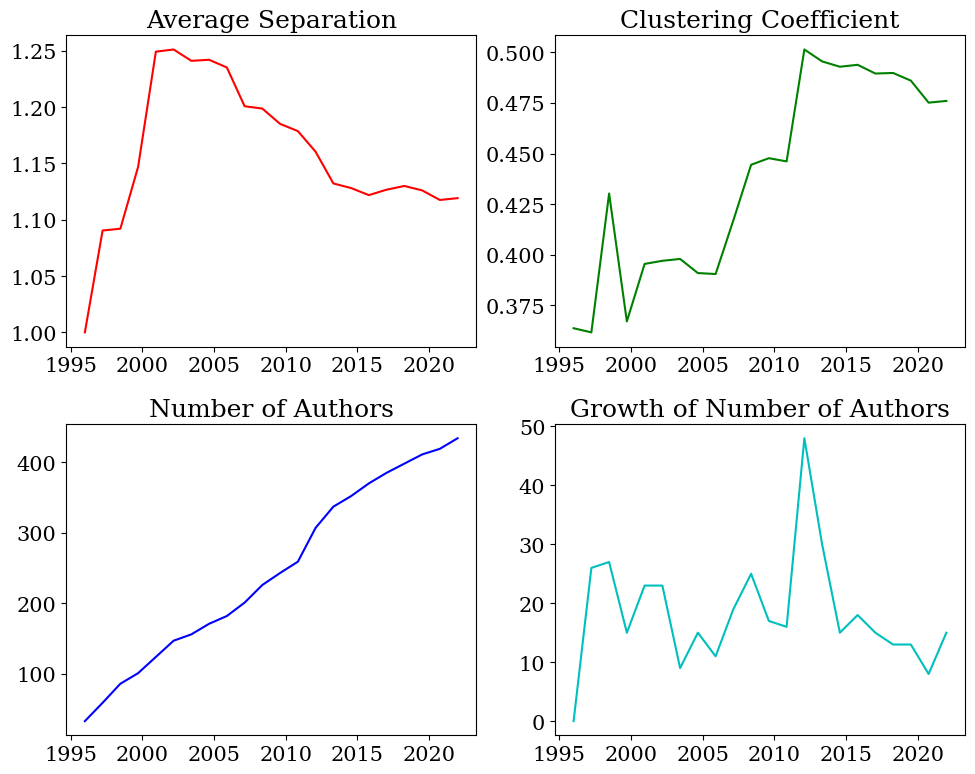

In [12]:
growth = [no_authors[i+1]-no_authors[i] for i in range(len(no_authors)-1)]
growth = [0]+growth

fig, axs = plt.subplots(2, 2, figsize=(10,8))  # Create a 2x2 grid of subplots
x = np.linspace(1996,2022,22)

# Plot on the first subplot (top-left)
axs[0, 0].plot(x,average_separation,'-r')
axs[0, 0].set_title('Average Separation')

# Plot on the second subplot (top-right)
axs[0, 1].plot(x,clustering_coefficient,'-g')
axs[0, 1].set_title('Clustering Coefficient')

# Plot on the third subplot (bottom-left)
axs[1, 0].plot(x,no_authors,'-b')
axs[1, 0].set_title('Number of Authors')

# Plot on the fourth subplot (bottom-right)
axs[1, 1].plot(x,growth,'-c')
axs[1, 1].set_title('Growth of Number of Authors')

# Adjust spacing between subplots
plt.tight_layout()

# Display the figure
plt.show()

[2001. 2002. 2003. 2004. 2005. 2006. 2007. 2008. 2009. 2010. 2011. 2012.
 2013. 2014. 2015. 2016. 2017. 2018. 2019. 2020. 2021. 2022.]


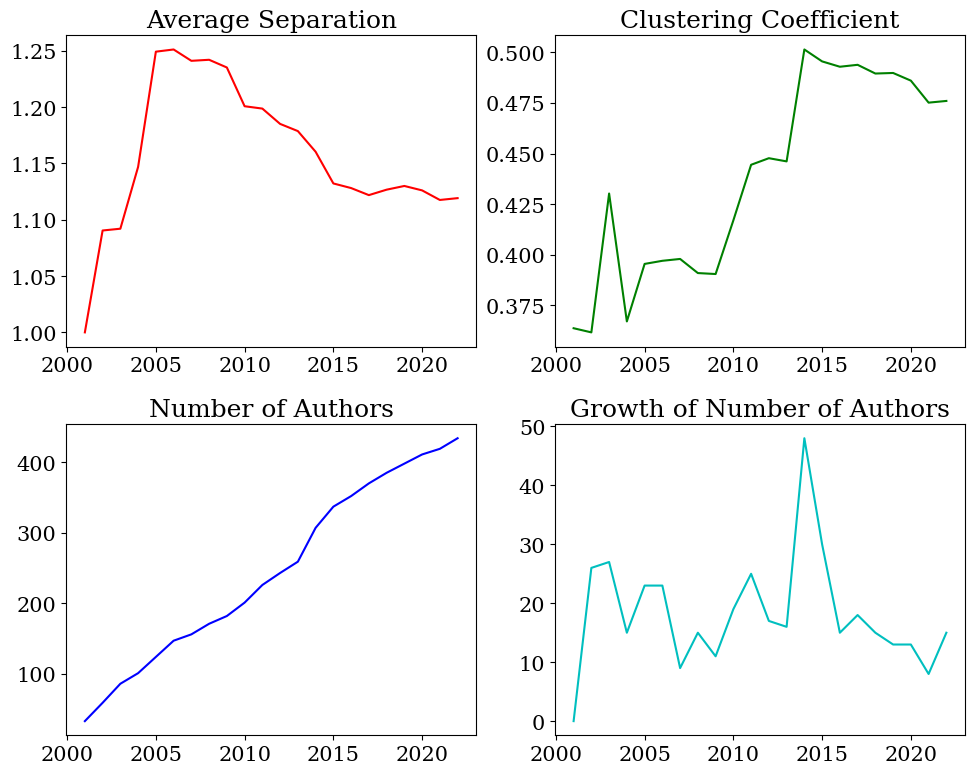

In [13]:
growth = [no_authors[i+1]-no_authors[i] for i in range(len(no_authors)-1)]
growth = [0]+growth

fig, axs = plt.subplots(2, 2, figsize=(10,8))  # Create a 2x2 grid of subplots
x = np.linspace(2001,2022,22)
print(x)
#x2 = np.linspace(1996,2023,25)
x2 = [1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2021,2022]

# Plot on the first subplot (top-left)
axs[0, 0].plot(x,average_separation,'-r')
#axs[0, 0].plot(x2,ciaa_average_seaparation,'-b',label='CIAA')
axs[0, 0].set_title('Average Separation')

# Plot on the second subplot (top-right)
axs[0, 1].plot(x,clustering_coefficient,'-g')
axs[0, 1].set_title('Clustering Coefficient')

# Plot on the third subplot (bottom-left)
axs[1, 0].plot(x,no_authors,'-b')
axs[1, 0].set_title('Number of Authors')

# Plot on the fourth subplot (bottom-right)
axs[1, 1].plot(x,growth,'-c')
axs[1, 1].set_title('Growth of Number of Authors')

# Adjust spacing between subplots
plt.tight_layout()

# Display the figure
plt.show()

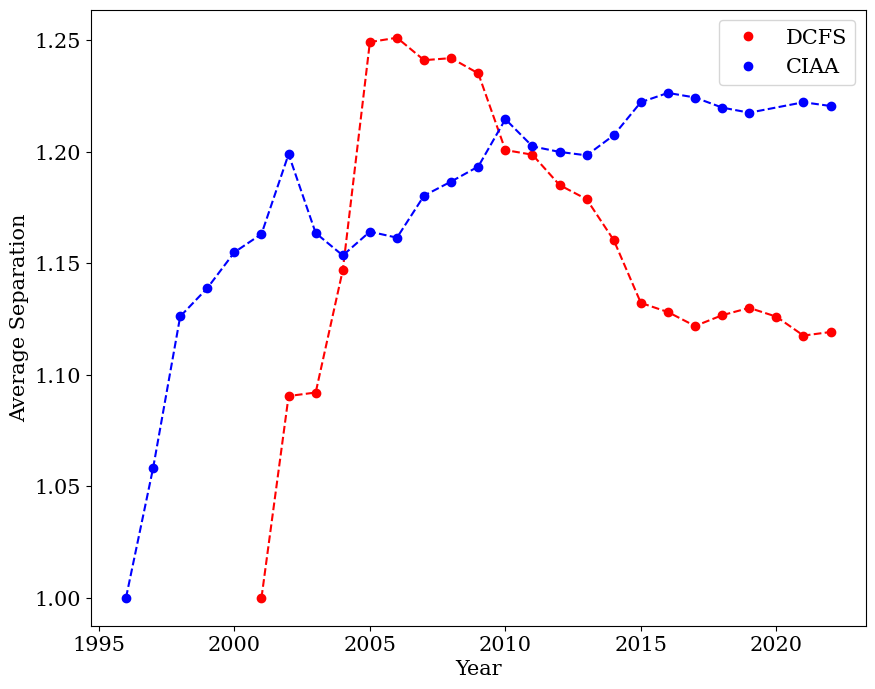

In [14]:
plt.figure(figsize=(10,8))

plt.plot(x,average_separation,'--r')
plt.plot(x2,ciaa_average_seaparation,'--b')
plt.plot(x,average_separation,'or',label='DCFS')
plt.plot(x2,ciaa_average_seaparation,'ob',label='CIAA')
plt.legend()
plt.xlabel('Year')
plt.ylabel('Average Separation')
plt.savefig('../../Figures/average_separation.png')

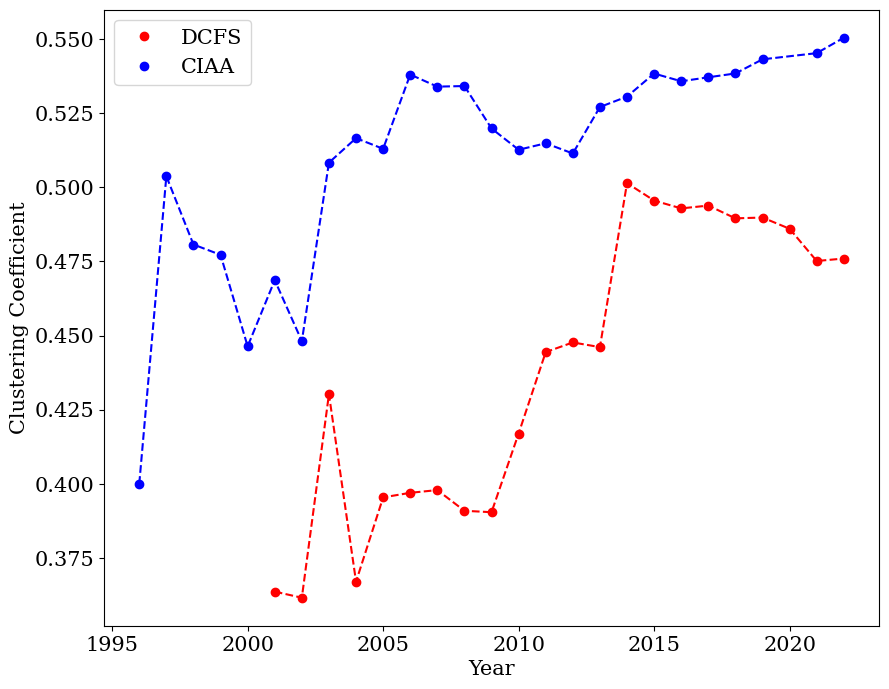

In [15]:
plt.figure(figsize=(10,8))

plt.plot(x,clustering_coefficient,'--r')
plt.plot(x2,ciaa_cc,'--b')
plt.plot(x,clustering_coefficient,'or',label='DCFS')
plt.plot(x2,ciaa_cc,'ob',label='CIAA')
plt.legend()
plt.xlabel('Year')
plt.ylabel('Clustering Coefficient')
plt.savefig('../../Figures/clustering_coefficient.png')

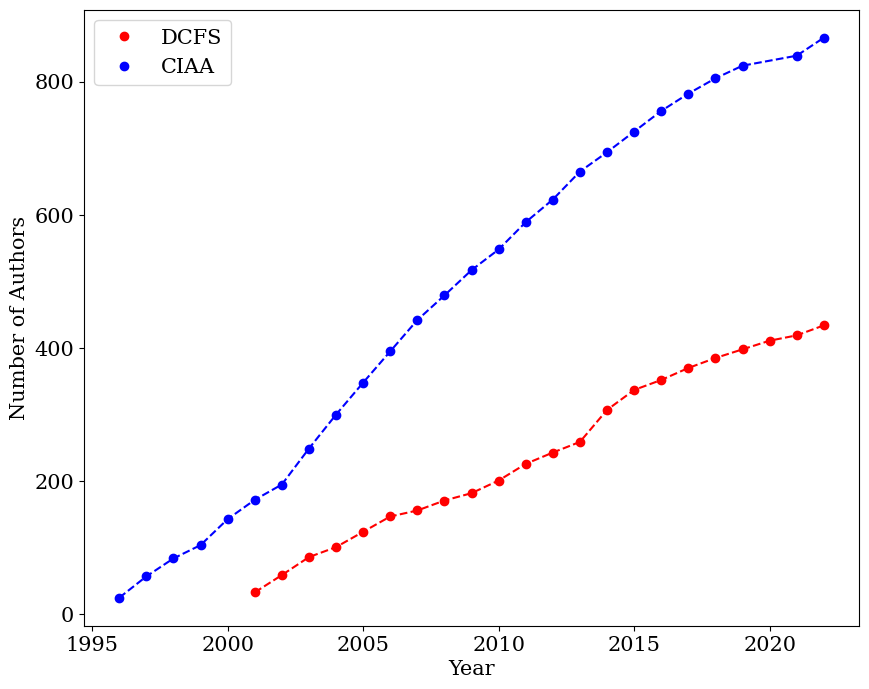

In [16]:
plt.figure(figsize=(10,8))

plt.plot(x,no_authors,'or',label='DCFS')
plt.plot(x2,ciaa_no_authors,'ob',label='CIAA')
plt.plot(x,no_authors,'--r')
plt.plot(x2,ciaa_no_authors,'--b')
plt.legend()
plt.xlabel('Year')
plt.ylabel('Number of Authors')
plt.savefig('../../Figures/no_authors.png')

[0, 26, 27, 15, 23, 23, 9, 15, 11, 19, 25, 17, 16, 48, 30, 15, 18, 15, 13, 13, 8, 15] [0, 32, 27, 20, 39, 29, 23, 54, 51, 48, 47, 47, 37, 38, 31, 41, 34, 42, 29, 31, 31, 26, 23, 19, 15, 27]


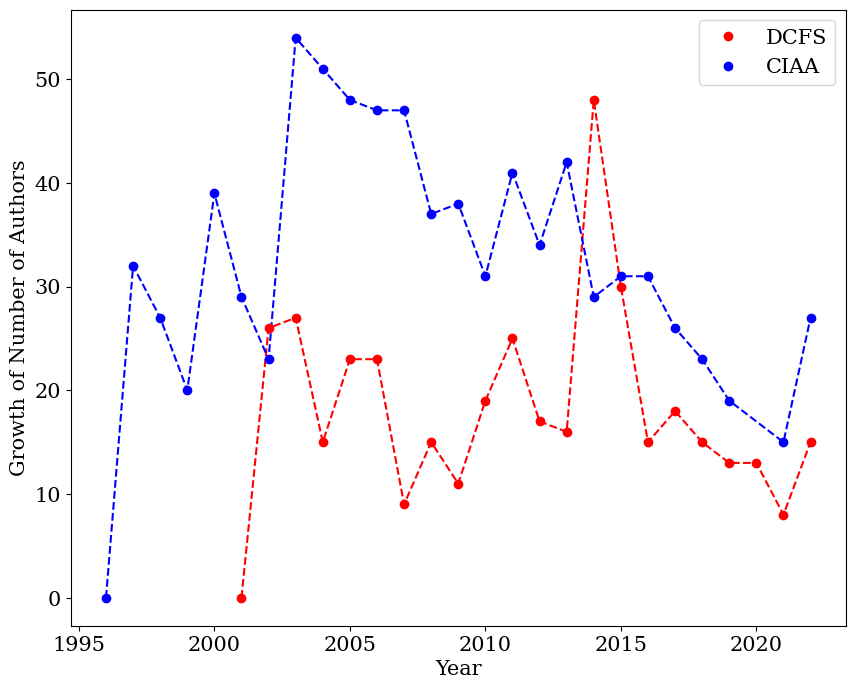

In [17]:
plt.figure(figsize=(10,8))

plt.plot(x,growth,'--r')
plt.plot(x2,ciaa_growth,'--b')
plt.plot(x,growth,'or',label='DCFS')
plt.plot(x2,ciaa_growth,'ob',label='CIAA')
plt.legend()
plt.xlabel('Year')
plt.ylabel('Growth of Number of Authors')
plt.savefig('../../Figures/growth.png')
print(growth, ciaa_growth)

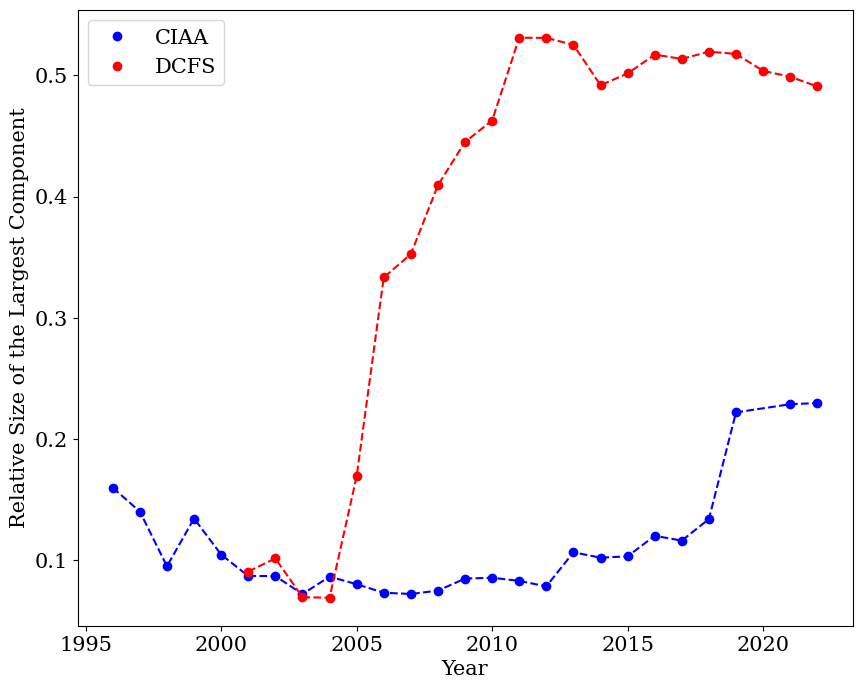

In [18]:
dcfs_relative_size = [largest_components[i]/no_authors[i] for i in range(len(largest_components))]
plt.figure(figsize=(10,8))
plt.plot(x2,ciaa_relative_size,'--b')
plt.plot(x2,ciaa_relative_size,'ob',label='CIAA')
plt.plot(x,dcfs_relative_size,'--r')
plt.plot(x,dcfs_relative_size,'or',label='DCFS')
plt.legend()
plt.xlabel('Year')
plt.ylabel('Relative Size of the Largest Component')
plt.savefig('../../Figures/largest_component_size.png')

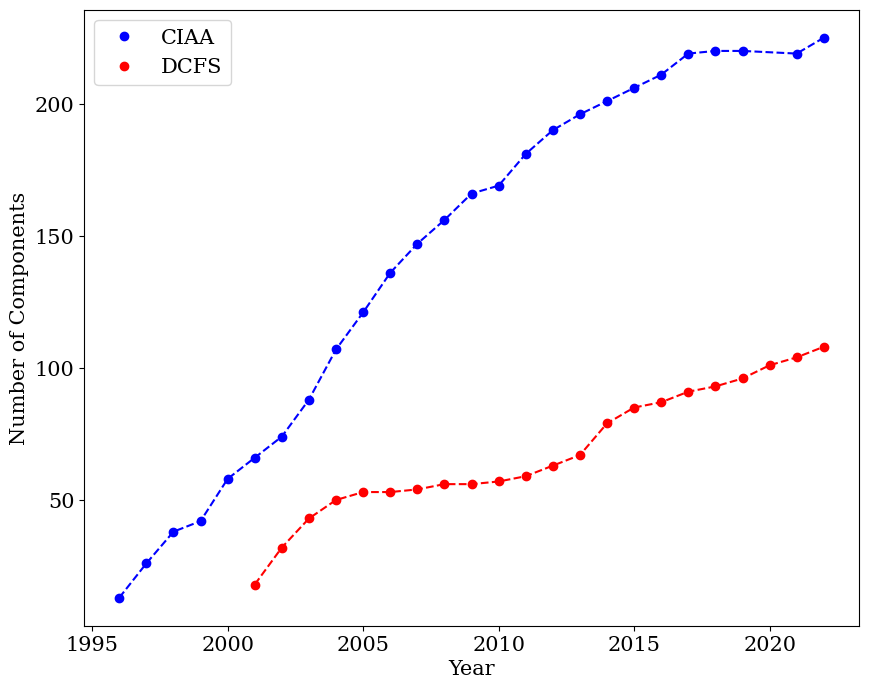

In [19]:
y = dcfs_no_components
y2 = ciaa_no_components
plt.figure(figsize=(10,8))
plt.plot(x2,y2,'--b')
plt.plot(x2,y2,'ob',label='CIAA')
plt.plot(x,y,'--r')
plt.plot(x,y,'or',label='DCFS')
plt.legend()
plt.xlabel('Year')
plt.ylabel('Number of Components')
plt.savefig('../../Figures/no_components.png')

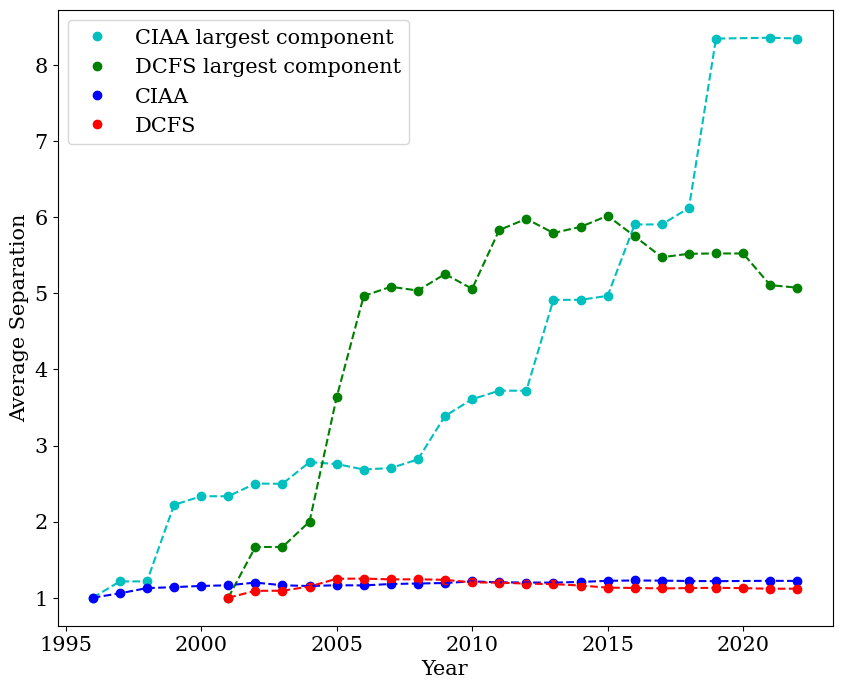

In [20]:
y = dcfs_largest_component_avg_separation
y2 = ciaa_largest_component_avg_separation
plt.figure(figsize=(10,8))
plt.plot(x2,y2,'--c')
plt.plot(x2,y2,'oc',label='CIAA largest component')
plt.plot(x,y,'--g')
plt.plot(x,y,'og',label='DCFS largest component')
plt.plot(x2, ciaa_average_seaparation,'ob',label='CIAA')
plt.plot(x,average_separation,'or',label='DCFS')
plt.plot(x2, ciaa_average_seaparation,'--b')
plt.plot(x,average_separation,'--r')
plt.legend()
plt.xlabel('Year')
plt.ylabel('Average Separation')
plt.savefig('../../Figures/avg_separation_largest_component.png')

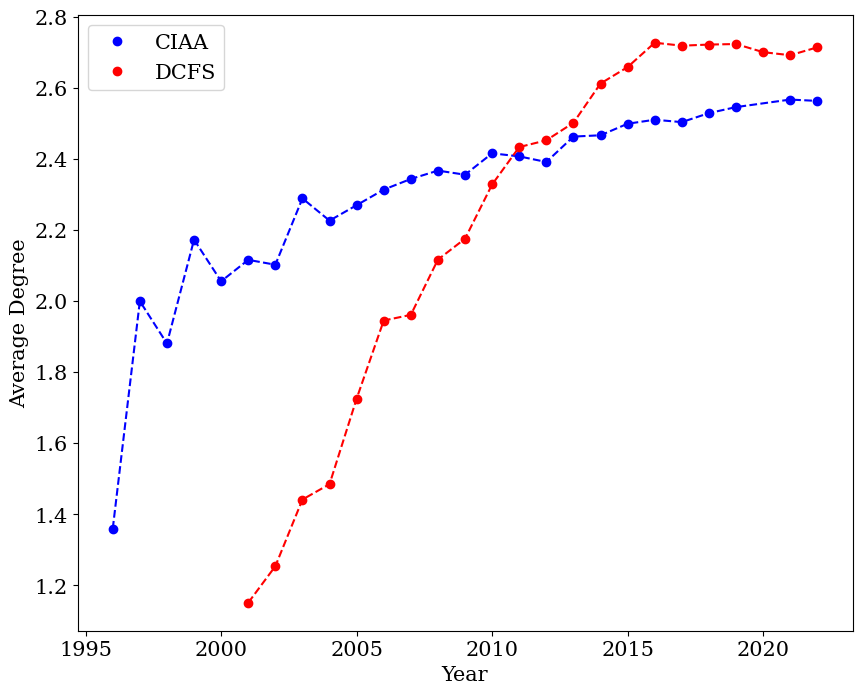

In [21]:
y = dcfs_average_degree
y2 = ciaa_average_degree
plt.figure(figsize=(10,8))
plt.plot(x2,y2,'--b')
plt.plot(x2,y2,'ob',label='CIAA')
plt.plot(x,y,'--r')
plt.plot(x,y,'or',label='DCFS')
plt.legend()
plt.xlabel('Year')
plt.ylabel('Average Degree')
plt.savefig('../../Figures/avg_degree.png')

## Internal Nodes

## New papers

[14, 22, 22, 16, 35, 24, 33, 33, 41, 35, 32, 34, 30, 32, 34, 27, 33, 31, 25, 26, 27, 20, 27, 19, 15, 19]
[19, 22, 26, 23, 28, 26, 16, 21, 18, 21, 25, 24, 26, 31, 24, 16, 24, 20, 22, 19, 16, 15]


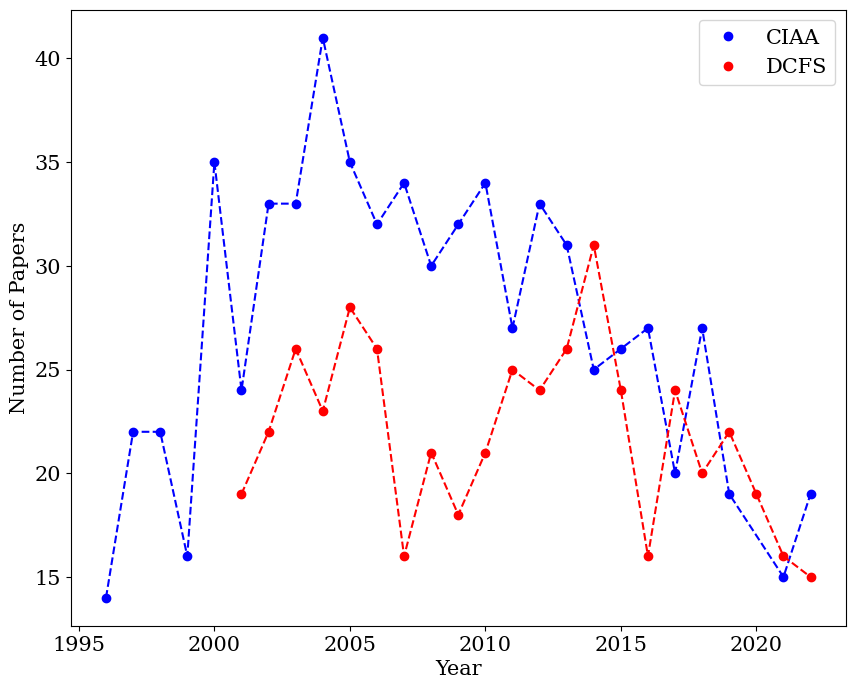

In [22]:
ciaa_papers = [len(set(entry['Title'].to_list())) for entry in ciaa_dynamic]
dcfs_papers = [len(set(entry['Title'].to_list())) for entry in dcfs_dynamic]
def difference(l):
    if len(l) == 1:
        return l
    return difference(l[:-1])+[l[-1]-l[-2]]
ciaa_papers = difference(ciaa_papers)
dcfs_papers = difference(dcfs_papers)
print(ciaa_papers)
print(dcfs_papers)
y = dcfs_papers
y2 = ciaa_papers
plt.figure(figsize=(10,8))
plt.plot(x2,y2,'--b')
plt.plot(x2,y2,'ob',label='CIAA')
plt.plot(x,y,'--r')
plt.plot(x,y,'or',label='DCFS')
plt.legend()
plt.xlabel('Year')
plt.ylabel('Number of Papers')
plt.savefig('../../Figures/no_of_papers.png')

### Prepare for Similiarity Measurement

In [23]:
ciaa_edges = list(ciaa_dynamic[-1].edges)
ciaa_edges

AttributeError: 'DataFrame' object has no attribute 'edges'